# Medium Post - Comparing Tweets from two banks using Python

In this post we are going to use two open source Python libraries called [Wordcloud](https://github.com/amueller/word_cloud) and [Scattertext](https://github.com/JasonKessler/scattertext) to help us visualize the Tweets from two brazilian banks from different generations: Itaú and Nubank.

We are not going to cover the process of scrapping the tweets.

We start with two json files consisting of tweets from 2014 to the beggining of February 2019 from both banks.

## Using pandas to read the .json files into DataFrames

In [65]:
import pandas as pd
df_nubank = pd.read_json('nubank_tweets.json')
df_nubank.head()

,created_at,favorite_count,id_str,in_reply_to_screen_name,is_retweet,retweet_count,source,text
0,2018-11-07 16:44:47,1,1060211471290908672,LariBaldasso,False,0,Twitter Web Client,@LariBaldasso 💜 https://t.co/6LThkxJFM9
1,2017-12-29 14:20:15,1,946747696953679872,Dhiego666,False,0,Twitter Web Client,@Dhiego666 https://t.co/rVgIK6Bcfl
2,2018-10-13 20:50:03,0,1051213500893282304,me_me_me,False,0,Twitter Web Client,@me_me_me 🤩 https://t.co/ZEmEIV1Gb3
3,2018-11-06 21:08:18,2,1059915400018825216,enriqueluislhs,False,0,Twitter Web Client,@enriqueluislhs https://t.co/FEN7BKhDFg
4,2015-08-25 16:39:35,1,636216359353978880,jonatasgmo,False,0,Zendesk,@jonatasgmo lindo é você!


By looking at the first 5 rows of our data we can see that these are tweets from the bank itself, some are replies to other people. 

We have some interesting columns: 'created_at', 'favorite_count' and 'retweet_count'.

Let's sort the tweets by the 'favorite_count' column and only keep tweets starting from January 2018. Since we'll need to clean the text let's also duplicate the text column to a new 'original_tweet' column to help us later.

In [66]:
df_nubank = df_nubank.sort_values(by=['favorite_count'],ascending=False).copy()
df_nubank = df_nubank.reset_index(drop=True)
df_nubank = df_nubank[df_nubank['created_at'] > '2018-01-01']
df_nubank['original_tweet'] = df_nubank['text']
df_nubank.head()

,created_at,favorite_count,id_str,in_reply_to_screen_name,is_retweet,retweet_count,source,text,original_tweet
0,2018-04-13 15:34:34,2810,984817125339648000,None,False,284,Twitter Web Client,Sorte do dia: trazer seu gatinho para o trabal...,Sorte do dia: trazer seu gatinho para o trabal...
1,2018-12-11 19:27:18,2741,1072573559074185216,None,False,240,Twitter Web Client,"Sim, transformamos a porta giratória em uma pe...","Sim, transformamos a porta giratória em uma pe..."
2,2018-12-10 17:05:07,2237,1072175389924122624,None,False,112,Twitter Web Client,Amanhã o caminho estará livre para todos. Você...,Amanhã o caminho estará livre para todos. Você...
4,2018-11-05 16:59:53,1688,1059490497591422976,None,False,63,Twitter Web Client,"Entre os nossos 5 milhões de clientes, esses s...","Entre os nossos 5 milhões de clientes, esses s..."
5,2018-08-22 15:03:16,1422,1032282057702105088,None,False,126,Twitter Web Client,O térreo do nosso prédio é aberto para visitaç...,O térreo do nosso prédio é aberto para visitaç...


As expected, when we sort the tweets by 'favorite_count' we don't see many responses to other tweets, but original tweets from the bank. Every NLP (Natural Language Processing) starts with cleaning the text. Let's do it now!

In [67]:
# Lower case
df_nubank['text'] = df_nubank['text'].apply(lambda x: " ".join(x.lower() for x in x.split()))
# Removing usernames
df_nubank['text'] = df_nubank['text'].str.replace('@[^\s]+',"")
# Removing urls
df_nubank['text'] = df_nubank['text'].str.replace('https?:\/\/.*[\r\n]*','')
# Removing punctuation
df_nubank['text'] = df_nubank['text'].str.replace('[^\w\s]','')
# Removing stopwords
from nltk.corpus import stopwords
stop = stopwords.words('portuguese')
df_nubank['text'] = df_nubank['text'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))
# Removing common brazilian names -> you will need a .txt with these, it is easy to find it online
names = pd.read_csv('nomes.txt', encoding='latin', header=None)
name_list = (names[0].str.lower()).tolist()
df_nubank['text'] = df_nubank['text'].apply(lambda x: " ".join(x for x in x.split() if x not in name_list))
# Removing numbers
df_nubank['text'] = df_nubank['text'].str.replace('\d+','')
# Removing small words -> e.g.: é, tá, lá, pra, etc
df_nubank['text'] = df_nubank['text'].str.replace(r'\b(\w{1,3})\b', '')
# Normalizing it
df_nubank.text = df_nubank.text.str.normalize('NFKD')\
                               .str.encode('ascii', errors='ignore')\
                               .str.decode('utf-8')
# Removing empty rows
import numpy as np
df_nubank['text'].replace('', np.nan, inplace=True)
df_nubank.dropna(subset=['text'], inplace=True)

Let's keep only the first 10k tweets from our dataframe

In [68]:
df_nubank = df_nubank[:10000]
df_nubank.head()

,created_at,favorite_count,id_str,in_reply_to_screen_name,is_retweet,retweet_count,source,text,original_tweet
0,2018-04-13 15:34:34,2810,984817125339648000,None,False,284,Twitter Web Client,sorte trazer gatinho trabalho sextafeira aqu...,Sorte do dia: trazer seu gatinho para o trabal...
1,2018-12-11 19:27:18,2741,1072573559074185216,None,False,240,Twitter Web Client,transformamos porta giratoria peca museu lug...,"Sim, transformamos a porta giratória em uma pe..."
2,2018-12-10 17:05:07,2237,1072175389924122624,None,False,112,Twitter Web Client,amanha caminho estara livre todos preparado sounu,Amanhã o caminho estará livre para todos. Você...
4,2018-11-05 16:59:53,1688,1059490497591422976,None,False,63,Twitter Web Client,milhoes clientes nomes frequentes encontrou,"Entre os nossos 5 milhões de clientes, esses s..."
5,2018-08-22 15:03:16,1422,1032282057702105088,None,False,126,Twitter Web Client,terreo predio aberto visitacao segunda sexta ...,O térreo do nosso prédio é aberto para visitaç...


By now you can see how different our 'text' column looks from the 'original_tweet'. We can investigate the frequency of words before we proceed to the wordcloud.

In [57]:
# Ten most frequent words
freq = pd.Series(' '.join(df_nubank['text']).split()).value_counts()[:10]
freq

gente      1766
roxinho     957
aqui        814
novo        682
pode        597
sempre      578
todos       541
assim       515
vamos       502
fica        486
dtype: int64

## Wordcloud

With our data already cleaned, let's combine all text in a big string to use the wordcloud library.

In [58]:
text = " ".join(review for review in df_nubank.text)
print ("There are {} words in the combination of all tweets.".format(len(text)))

There are 461477 words in the combination of all tweets.


Now let's plot our wordcloud!

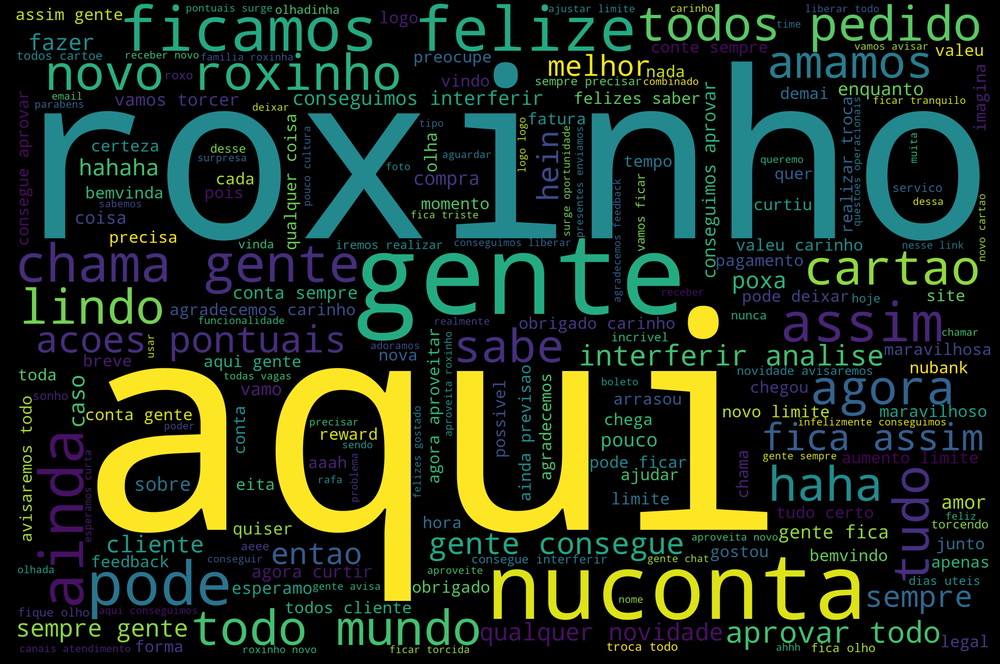

In [7]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
%matplotlib inline
stopwords = set(STOPWORDS)
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = stopwords).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Awesome right?! Let's do the same for Itaú and proceed to the scattertext!

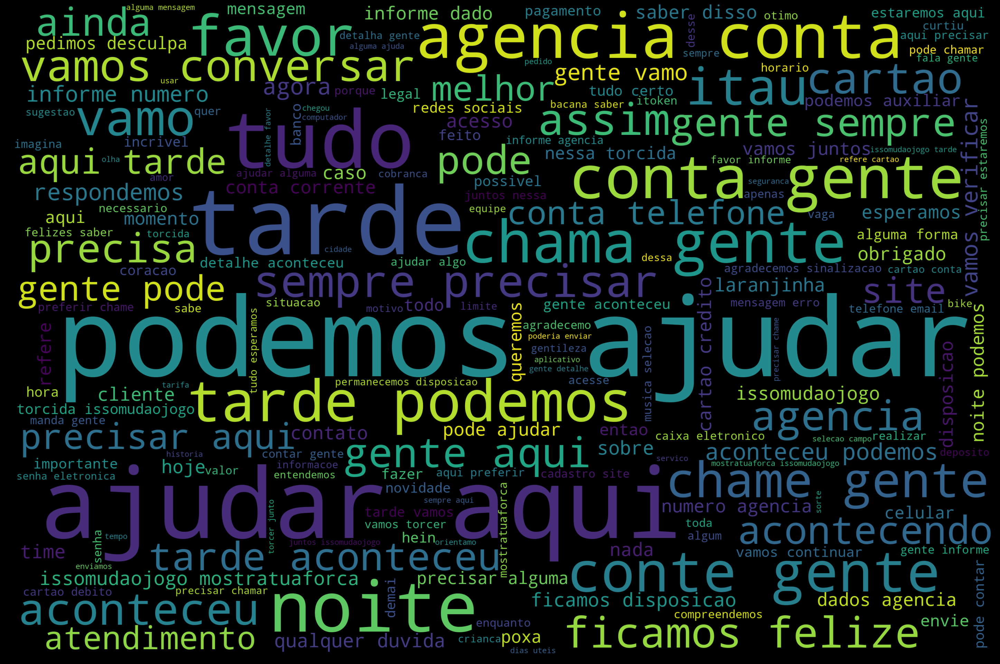

In [69]:
df_itau = pd.read_json('itau_tweets.json')
# sorting by fav count
df_itau = df_itau.sort_values(by=['favorite_count'],ascending=False).copy()
df_itau = df_itau.reset_index(drop=True)
df_itau = df_itau[df_itau['created_at'] > '2018-01-01']
df_itau['original_tweet'] = df_itau['text']
# Data Cleaning
# Lower case
df_itau['text'] = df_itau['text'].apply(lambda x: " ".join(x.lower() for x in x.split()))
# Removing usernames
df_itau['text'] = df_itau['text'].str.replace('@[^\s]+',"")
# Removing urls
df_itau['text'] = df_itau['text'].str.replace('https?:\/\/.*[\r\n]*','')
# Removing punctuation
df_itau['text'] = df_itau['text'].str.replace('[^\w\s]','')
# Removing stopwords
from nltk.corpus import stopwords
stop = stopwords.words('portuguese')
df_itau['text'] = df_itau['text'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))
# Removing common brazilian names -> you will need a .txt with these, it is easy to find it online
names = pd.read_csv('nomes.txt', encoding='latin', header=None)
name_list = (names[0].str.lower()).tolist()
df_itau['text'] = df_itau['text'].apply(lambda x: " ".join(x for x in x.split() if x not in name_list))
# Removing numbers
df_itau['text'] = df_itau['text'].str.replace('\d+','')
# Removing small words -> e.g.: é, tá, lá, pra, etc
df_itau['text'] = df_itau['text'].str.replace(r'\b(\w{1,3})\b', '')
# Normalizing it
df_itau.text = df_itau.text.str.normalize('NFKD')\
                               .str.encode('ascii', errors='ignore')\
                               .str.decode('utf-8')
# Removing empty rows
import numpy as np
df_itau['text'].replace('', np.nan, inplace=True)
df_itau.dropna(subset=['text'], inplace=True)
# Using only the first 10k tweets
df_itau = df_itau[:10000]
text_itau = " ".join(review for review in df_itau.text)
# Wordcloud
stopwords = set(STOPWORDS)
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = stopwords).generate(text_itau)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

## Scattertext
From the github repo:
> "A tool for finding distinguishing terms in small-to-medium-sized corpora, and presenting them in a sexy, interactive scatter plot with non-overlapping term labels. Exploratory data analysis just got more fun."

The scattertext library takes two instances of some category, text and metadata(optionally) to create a scatter plot of the words in a beautiful manner. 

Let's prepare our dataframe combining both categories in one dataframe and use the created_at and original_tweet as metadata to help us contextualize the text.

In [70]:
df_nubank['bank'] = 'nubank'
df_nubank['metadata'] = df_nubank.created_at.map(str) + " | " + df_nubank.original_tweet
df_nubank = df_nubank[['metadata', 'bank', 'text']]
df_nubank.head()

,metadata,bank,text
0,2018-04-13 15:34:34 | Sorte do dia: trazer seu...,nubank,sorte trazer gatinho trabalho sextafeira aqu...
1,"2018-12-11 19:27:18 | Sim, transformamos a por...",nubank,transformamos porta giratoria peca museu lug...
2,2018-12-10 17:05:07 | Amanhã o caminho estará ...,nubank,amanha caminho estara livre todos preparado sounu
4,2018-11-05 16:59:53 | Entre os nossos 5 milhõe...,nubank,milhoes clientes nomes frequentes encontrou
5,2018-08-22 15:03:16 | O térreo do nosso prédio...,nubank,terreo predio aberto visitacao segunda sexta ...


In [71]:
df_itau['bank'] = 'itau'
df_itau['metadata'] = df_itau.created_at.map(str) + " | " + df_itau.original_tweet
df_itau = df_itau[['metadata', 'bank', 'text']]
df_itau.head()

,metadata,bank,text
0,"2018-07-05 18:25:41 | @Chris_Delgado Oi, Chris...",itau,chris tudo repudiamos todo tipo preconceito ...
1,"2019-02-05 23:33:44 | Hey, @RockinRio!!! Nós o...",itau,ouvimos nova atracao correr fila noticia h...
2,2019-01-11 18:25:06 | Toda história de amor é ...,itau,toda historia amor historia parceria anos na...
3,2018-06-14 15:40:42 | @ShawnMendes @selecaopor...,itau,issomudaojogo
4,"2018-07-02 15:52:22 | Tem que respeitar, tá li...",itau,respeitar ligadomostratuaforca


Appending the dataframes and using the scattertext library

In [72]:
df_scatter = df_nubank.append(df_itau)

In [80]:
import scattertext as st
import spacy
nlp = spacy.load('pt')
corpus = (st.CorpusFromPandas(df_scatter,
                              category_col='bank',
                              text_col='text',
                              nlp=nlp)
             .build()
             .get_unigram_corpus()
             .compact(st.ClassPercentageCompactor(term_count=1,
                                                   term_ranker=st.OncePerDocFrequencyRanker)))
html = st.produce_scattertext_explorer(corpus,
                                       category='nubank',
                                       category_name='Nubank',
                                       not_category_name='Itaú',
                                       width_in_pixels=1000,
                                       metadata=corpus.get_df()['metadata'])
open("visualization_nubank_itau.html", 'wb').write(html.encode('utf-8'))

4805311

## Exploring the Scattertext html file

After you run the code above, an .html file is created at the current folder and you can open it in your browser to explore.

You can access a live version on this [link](https://s3.amazonaws.com/scatter-nubank-itau/visualization_nubank_itau.html), but I will post some screenshots to ilustrate.

This is what you are presented when you open the file.

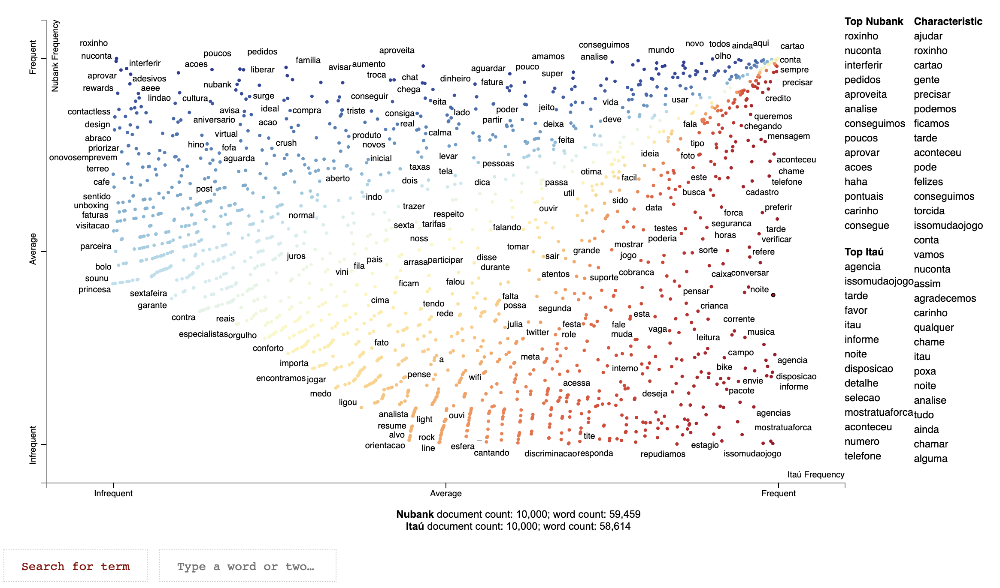

In [81]:
from IPython.display import Image
Image(filename='scatter_nubank_itau.png')

On the top-left corner you can see the words that were used more by Nubank and less by Itaú. On the bottom-right corner you see the words used more by Itaú and less by Nubank.

Bottom-left corner shows the least frequent terms of this corpus and top-right corner the most frequent ones.


## Searching for specific terms

We can see that **'ajudar'** (help in portuguese) is the most characteristic word of this corpus. One of the cool features of scattertext is that you can click on the word, or type it on the search box and see the frequency it appears in each category and even see where it appears with the metadata we created

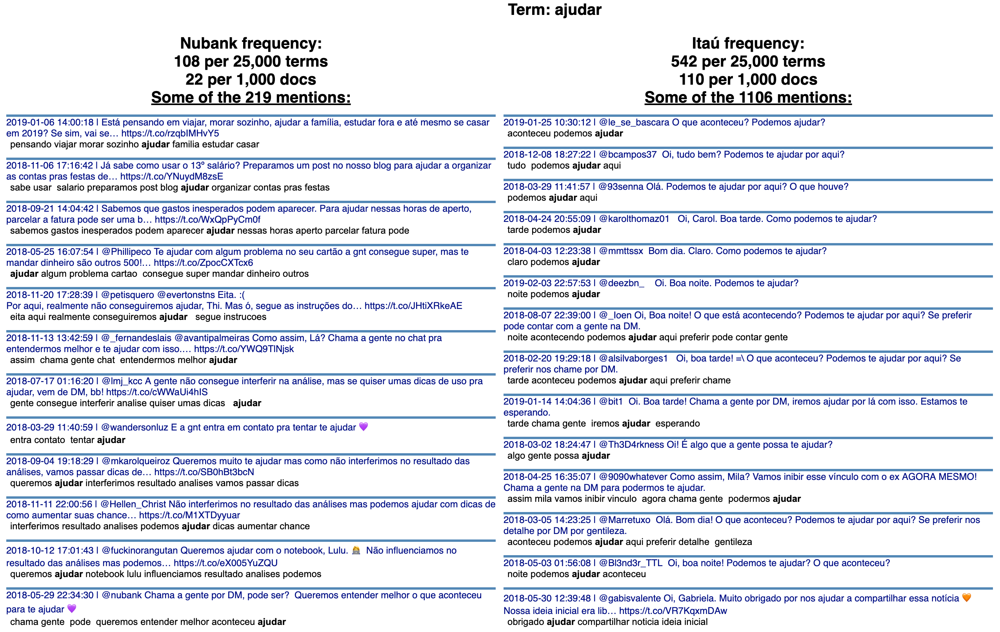

In [83]:
Image(filename='ajudar.png')

The term **'agência'** (agency in portuguese) is the top term from Itaú, appearing 586 times, while it appear only 4 times in the Nubank category.

A quick google search shows that Itaú was founded in January 2, 1945, while Nubank was founded in May 6, 2013, so it is reasonable that we find contrasts like this.

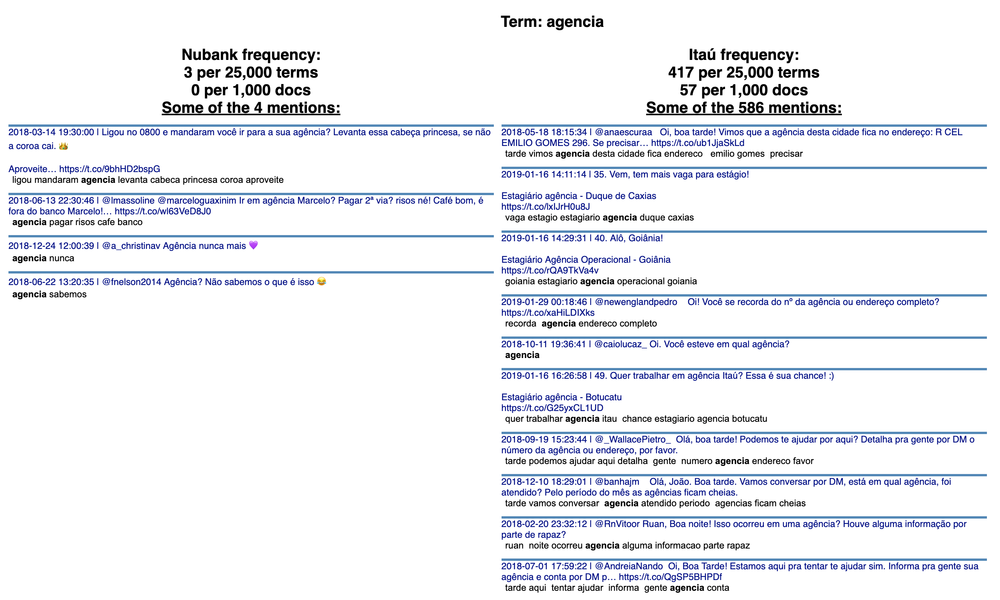

In [36]:
Image(filename='agencia.png')

The term **'roxinho'** (a cute way of saying purple in portuguese) is the top term from Nubank. Nubank uses this word as a nickname for their flagship product: their credit card.

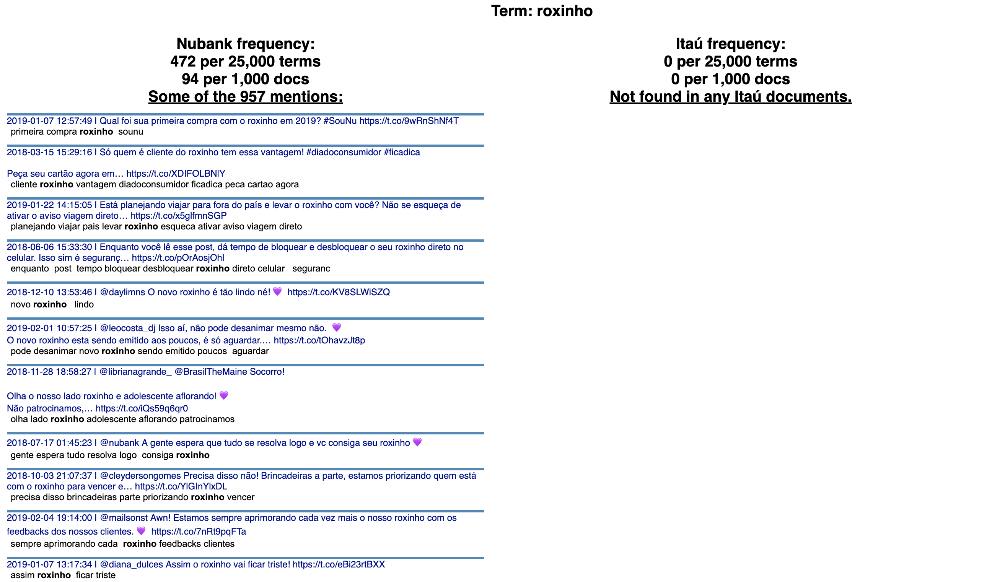

In [82]:
Image(filename='roxinho.png')

# Emoji analysis

Scattertext introducing text says:
> Exploratory data analysis just got more fun.

Let's take fun to the next level, we will compare the emoji on the tweets from both banks!
Play with the live version on this [link](https://s3.amazonaws.com/scatter-nubank-itau/emoji_nubank_itau.html).

In [79]:
corpus = st.CorpusFromParsedDocuments(df_scatter,
                                      parsed_col='metadata',
                                      category_col='bank',
                                      feats_from_spacy_doc=st.FeatsFromSpacyDocOnlyEmoji()).build()
html = st.produce_scattertext_explorer(corpus,
                                       category='nubank',
                                       category_name='Nubank',
                                       not_category_name='Itaú',
                                       metadata=(corpus.get_df()['metadata']),
                                       width_in_pixels=1000)
open("emoji_nubank_itau.html", 'wb').write(html.encode('utf-8'))

6241914

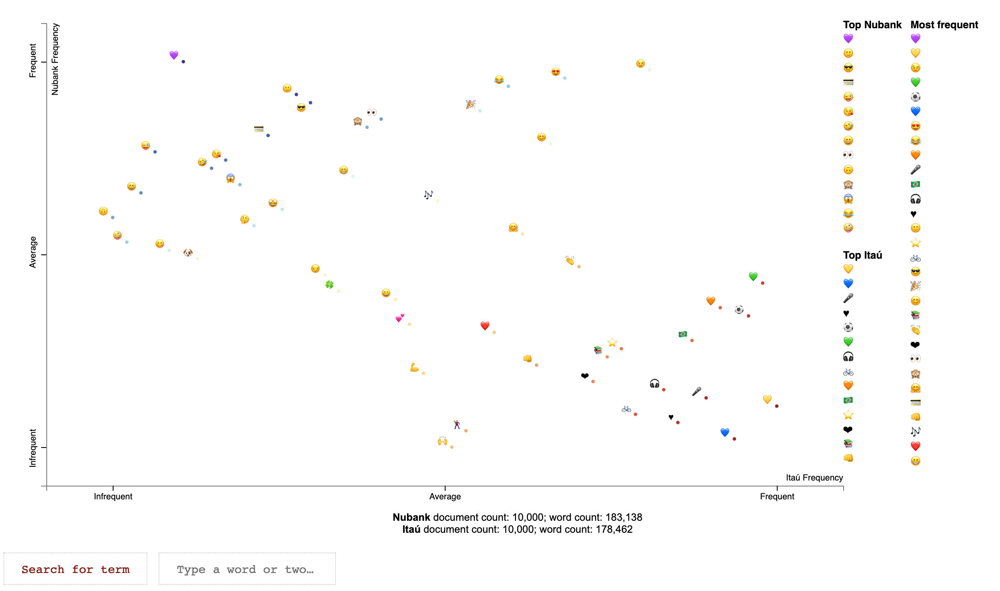

In [76]:
Image(filename='emoji.png')

We are presented with a scatter plot of emoji positioned based on the frequency they appear on the corpus for each category. How awesome is that?!

Playing around with the plot we see **hearts** everywhere, but a clear distinction between their color.

Keep in mind that we filtered the tweets only for those starting from January 2018, and 2018 was a World Cup year. Brazilians love soccer and social media, [data](https://www.flimper.com/blog/en/twitter-the-world-cup-a-symbiotic-relationship) corroborate that.

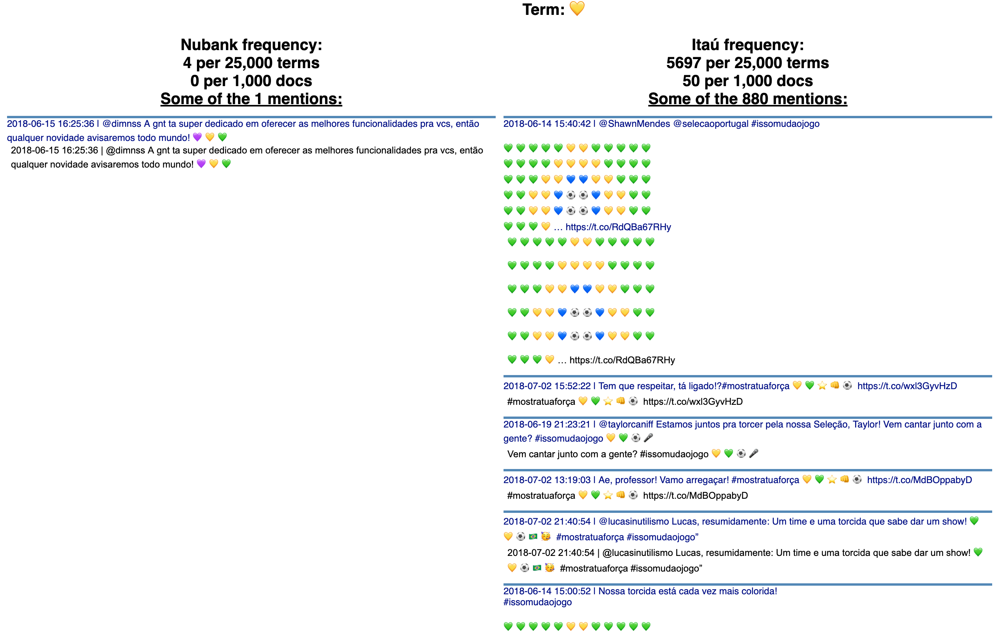

In [77]:
Image(filename='heart_itau.png')

The hearts from Itaú were filled most from the brazilian flag colors and the bank's main color: orange.


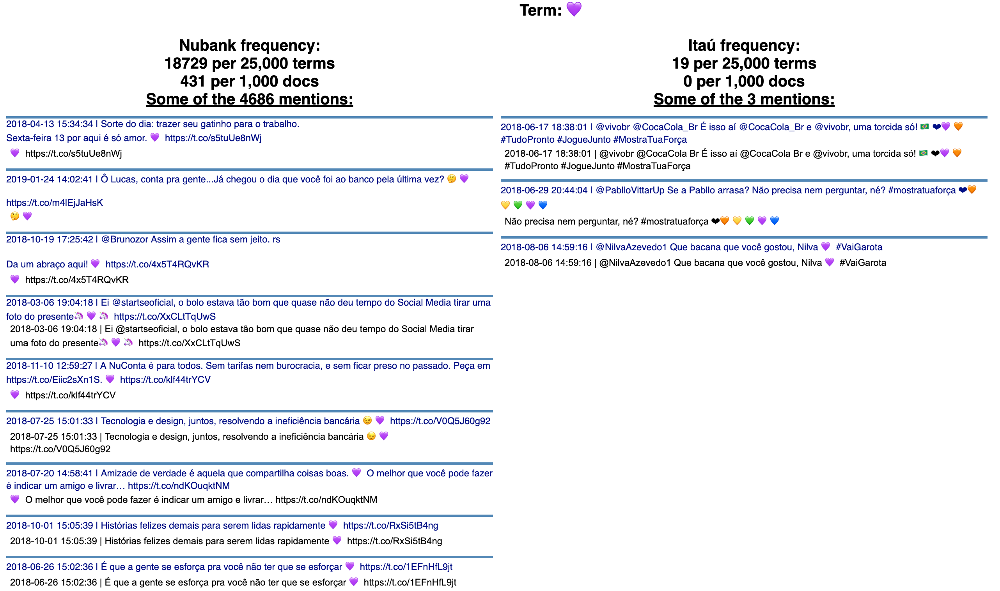

In [78]:
Image(filename='heart_nubank.png')

The hearts from Nubank on the other hand, were filled the signature color from the brand: purple.

## Wrapping up

Nowadays, data is being generated at an unprecedented fast pace and we should be able to make the best decisions supported by it.

Being able to gather information, clean it and process it is a skill that every company can benefit from, but must be done responsably and ethically.

## Citation for the Scattertext library
Jason S. Kessler. Scattertext: a Browser-Based Tool for Visualizing how Corpora Differ. ACL System Demonstrations. 2017.